# Numerical Modeling, Term 3, 2023

## Problem Set 2

**NOTE:** You can use the code that was presented in lectures.

### Problem 1 (Image Processing) (40pt)

Let us consider a problem of denoising a color image, by solving the following PDE:
$$
\begin{align*}
\frac{\partial}{\partial t} u _i &= {\rm div} (\nabla u _i) + \lambda (u_i^{(0)}-u _i) \\
u _i|_{t=0} &= u^{(0)} _i \\
u _i| _{\partial\Omega} &= u^{(0)} _i| _{\partial\Omega} \\
\end{align*}
$$
where $u_i$, $i=1,2,3$, is the intensity of the red, green, and blue components of the image;
$u^{(0)}_i$ represents the original image.
The parameter $\lambda$ should be inversely proportional to the level of noise, and can be taken, for a start, as 1/100 or 1/200.
The time of integration should be taken so that we can approximate a steady-state solution.

* Take a noisy image from <a href="https://github.com/oseledets/fastpde/blob/master/fig/color_photo_noisy.png">here</a> or generate it yourself. (If you generate yourself then make the noise level to be 64 out of 256.)

* **(10pt)** Write a code that solves the system
* **(10pt)** Set $\lambda=1/200$ and try getting some results with $\tau=0.025$, $\tau=0.25$, and  $\tau=2.5$. Comment on the results and explain them.

### Algorithm of Solution

First of all, we can see that 
$$
\begin{align*}
{\rm div} (\nabla u _i) = {\Delta}u _i
\end{align*}
$$

Therefore, we have two-dimensional Poisson equation with an extra term $\lambda (u_i^{(0)}-u _i)$. Let's discretize laplacian for the exact $i$:

$$
{\Delta}u_h = Au_h = \frac{ u(x + h,y) - 2u(x,y) + u(x − h, y)}{h^2} + \frac{ u(x,y + h) - 2u(x,y) + u(x, y + h)}{h^2},
$$

where $A$ is a laplassian operator from $pyamg lib$ (A was written for Poisson problem with negative sign). Hence, the whole equation in the discrete form for different time steps will be:
$$
u(t + \tau) = u(t) − \tau(Au_h + \lambda (u_h^{(0)}-u_h))
$$

*Important note: 

Since we are dealing with three channels for image (RGB), we need to solve this problem for each channel separately.

In [2]:
from PIL import Image
from io import BytesIO
import numpy as np
import scipy as sp
import pyamg

img = Image.open('fig/color_photo_ref.png')
imarray_orig = np.array(img)

img = Image.open('fig/color_photo_noisy.png')
imarray = np.array(img)
imarray_noisy = imarray.astype(float)

Original image:


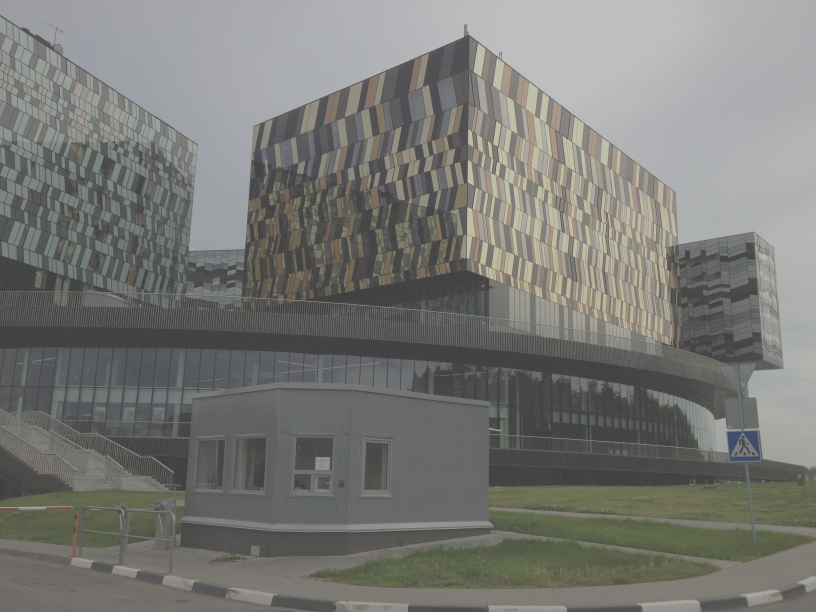

For tau = 0.025

Initial noisy image:


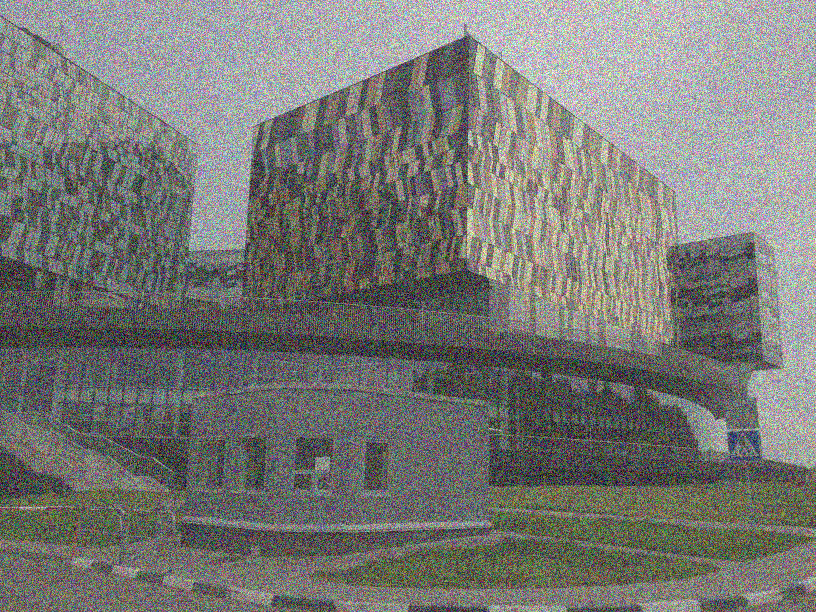

Final noisy image:


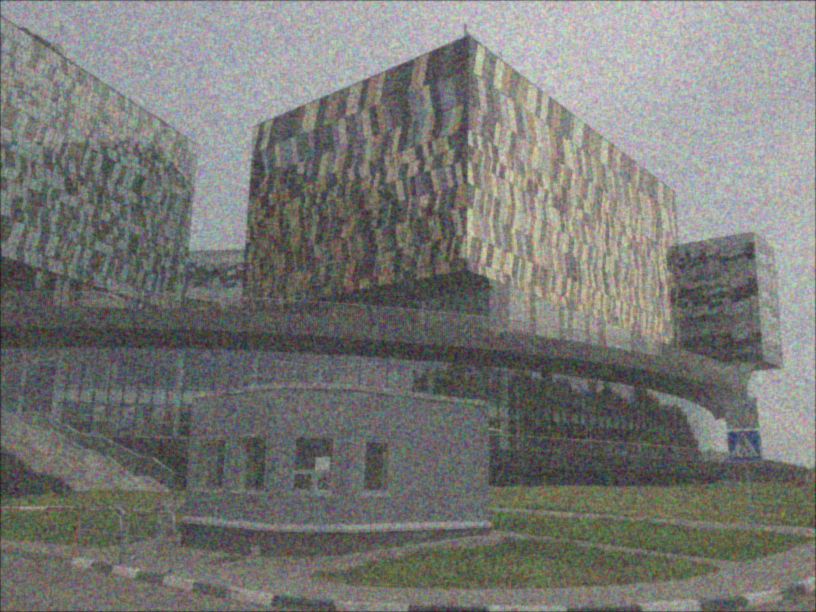

For tau = 0.25

Initial noisy image:


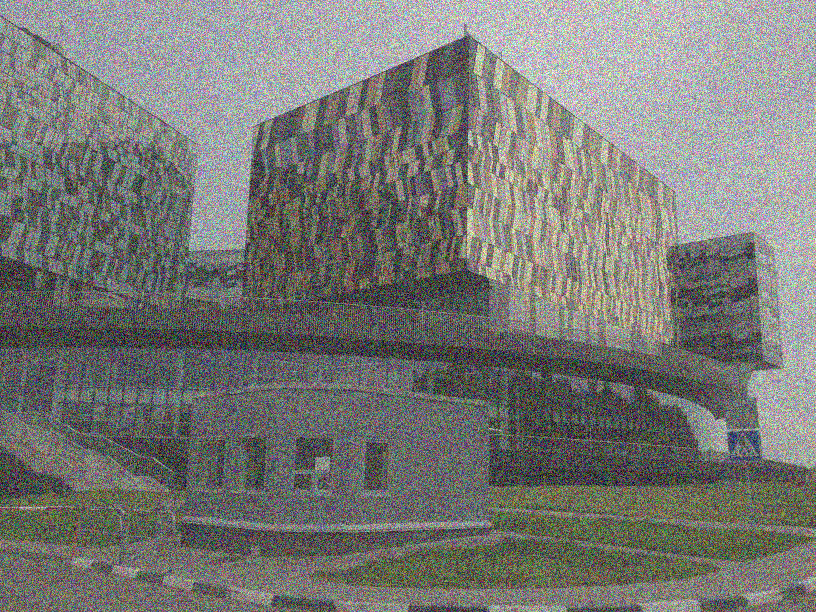

Final noisy image:


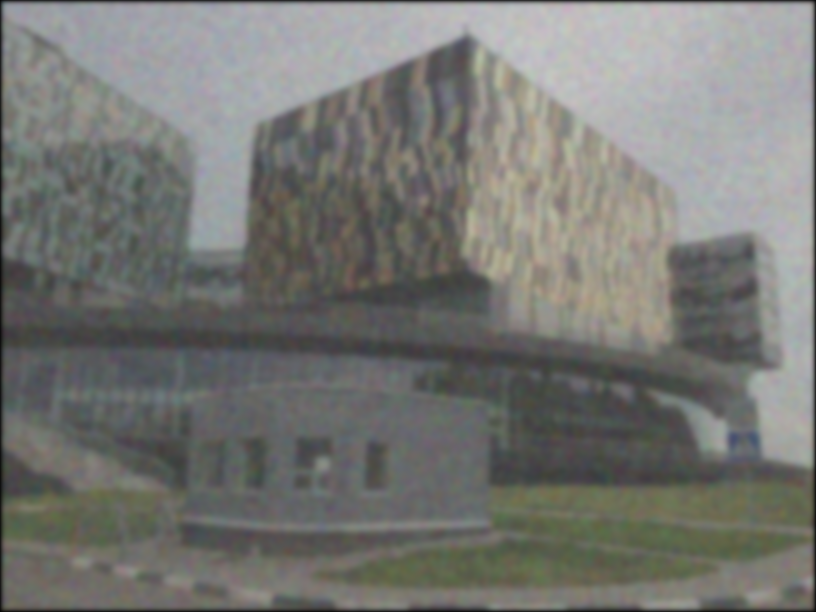

For tau = 0.4

Initial noisy image:


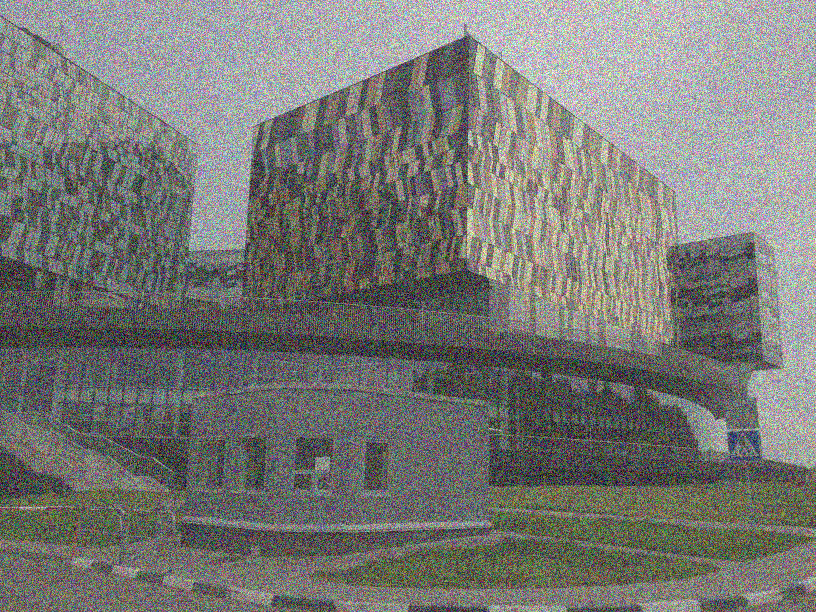

Final noisy image:


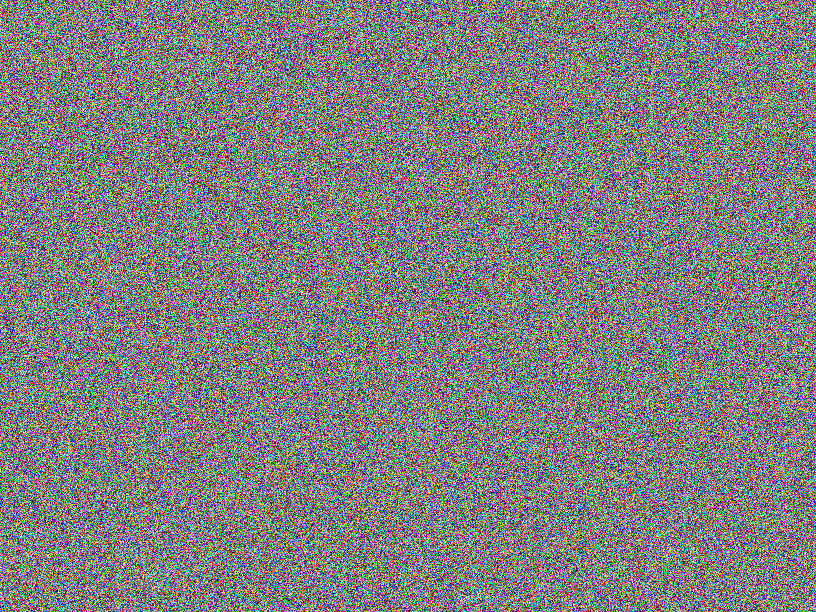

For tau = 2.5

Initial noisy image:


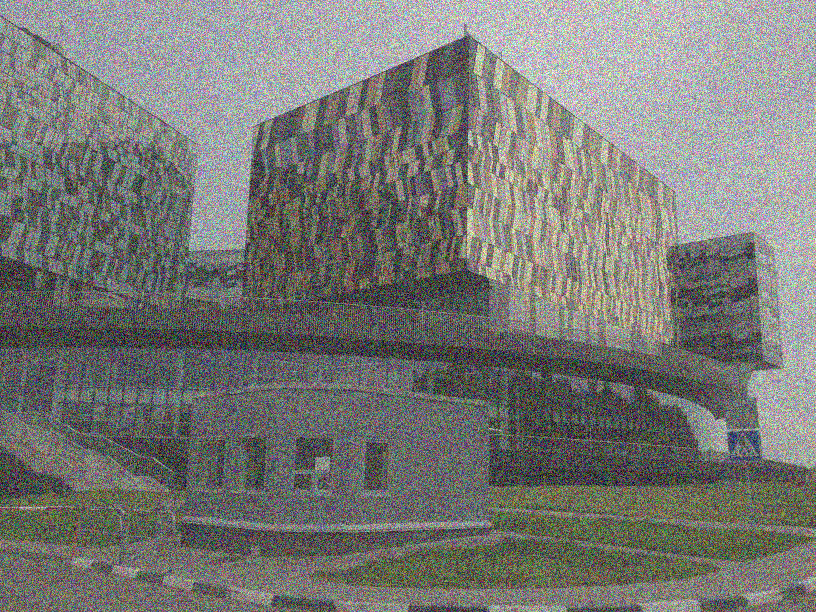

Final noisy image:


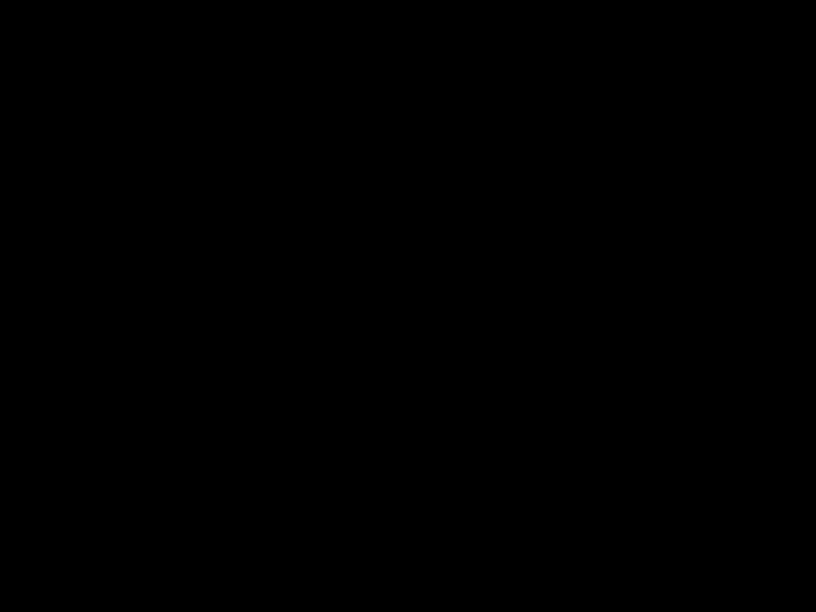

In [3]:
# Slice imarray into RGB channels and convert arrays into one-dimensional vector
red_im = imarray_noisy[:,:,0].copy()
vec_r = red_im.reshape(-1,1);
vec_r_0 = vec_r.copy() # initial image

green_im = imarray_noisy[:,:,1].copy()
vec_g = green_im.reshape(-1,1);
vec_g_0 = vec_g.copy() # initial image

blue_im = imarray_noisy[:,:,2].copy()
vec_b = blue_im.reshape(-1,1);
vec_b_0 = vec_b.copy() # initial image
assert vec_r.shape==vec_g.shape==vec_b.shape

# Let's take the matrix for Poisson problem from the box
A = sp.sparse.csr_matrix(pyamg.gallery.laplacian.poisson(red_im.shape))

# Evaluate the solution of Poisson problem within time
lam = 1 / 200
time_range = range(1, 20) 
tau_l = [0.025, 0.25, 0.4, 2.5]
for tau in tau_l:
    for iter in time_range:
        vec_r += -tau*A*vec_r + tau*lam*(vec_r_0 - vec_r)
        vec_g += -tau*A*vec_g + tau*lam*(vec_g_0 - vec_g)
        vec_b += -tau*A*vec_b + tau*lam*(vec_b_0 - vec_b)

    im_r = vec_r.reshape(red_im.shape);
    im_g = vec_g.reshape(red_im.shape);
    im_b = vec_b.reshape(red_im.shape);

    rgb = np.dstack((im_r,im_g,im_b))
    imarray_blur = rgb.astype(dtype="uint8")

    import PIL
    from IPython.display import display, Image
    def display_img_array(ima):
        im = PIL.Image.fromarray(ima)
        bio = BytesIO()
        im.save(bio, format='png')
        display(Image(bio.getvalue(), format='png', retina=True))
    
    if tau == 0.025:
        print("Original image:")
        display_img_array(imarray_orig)
    print(f'For tau = {tau}\n')
    print("Initial noisy image:")
    display_img_array(imarray_noisy.astype(dtype="uint8"))
    print("Final noisy image:")
    display_img_array(imarray_blur)

Let's investigate the stability of diffusion equation. So, the criteria of stability for this one is that eigenvalues of $I + \tau(\Delta _h - \lambda)$ are between $-1$ and $1$. Let's find eigenvalues, taking into account that eigenvector:

$$
v_{m,l} = v_0 + sin(\pi mx)sin(\pi ly),
$$


$$
Av_{m,l} = \lambda_{m,l}v_{m,l},
$$
 where A is an operator $(\Delta_h(x,y))$.
 
Finally, the eigenvalues:
$$
\lambda_{m,l} = -\frac{4}{h^2}sin^2(\frac{\pi mh}{2})-\frac{4}{h^2}sin^2(\frac{\pi lh}{2})
$$

Therefore, the condition of stability:
$$
-1 \le 1 + \tau(-\frac{4}{h^2}sin^2(\frac{\pi mh}{2})-\frac{4}{h^2}sin^2(\frac{\pi lh}{2}) - \lambda) \le 1
$$
For $m = 1, l = 1$:
$$
\tau \le \frac{2}{8 + \lambda} \approx 0.2498
$$

**Conclusion:** the solution for $\tau = 2.5$ is diverged, for $\tau = 0.025$ is converged and for $\tau = 0.25$ the solution is also diverged, but not immediately. 

Let us consider a more advanced approach:
$$
\begin{align*}
\frac{\partial}{\partial t} u _i &= {\rm div} (k \nabla u _i) + \lambda (u^{(0)}-u _i) \\
u _i|_{t=0} &= u^{(0)} _i \\
u _i| _{\partial\Omega} &= u^{(0)} _i| _{\partial\Omega} \\
\end{align*}
$$
where now $k=\big(1 + \max_i |\nabla u_i|^2\big)^{-1/2}$.

* **(10pt)** Write a code that solves the system
* **(10pt)** Give results for three values of $\lambda$, for which the final image is (1) Too noisy, (2) Too blurry, (3) About right

### Algorithm of Solution

In this approach, we assume $k$ isn't constant. Let's calculate value of $k$ each time step.

In [4]:
from IPython.display import clear_output, display
import matplotlib.pyplot as plt
from numba import jit

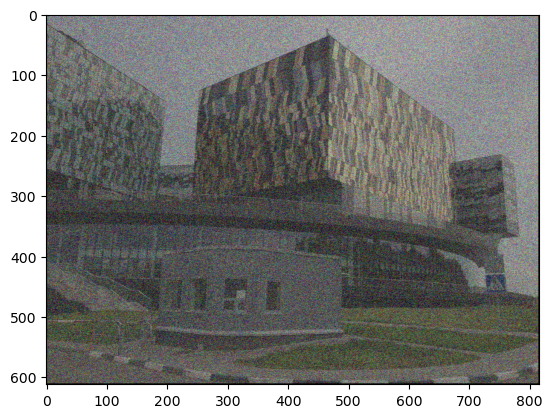

In [5]:
imarray_initial = imarray
img_r, img_g, img_b = img.split()

imarray_r = np.array(img_r)
imarray_g = np.array(img_g)
imarray_b = np.array(img_b)
res_r = imarray_r.copy()
res_g = imarray_g.copy()
res_b = imarray_b.copy()

def search_k(u):
    k_x_rel, k_y_rel = np.gradient(u)
    return (1 + (k_x_rel**2 + k_y_rel**2).max())**(-0.5)

@jit
def iteration(u, dt, h, lamb, u_initial, k): #k = 1
    res = np.zeros(u.shape)
    for i in range(u.shape[0]-2):
        for j in range(u.shape[1]-2):
            res[i+1][j+1] = u[i+1][j+1] + dt*(k*(u[i+2][j+1]-2*u[i+1][j+1]+u[i][j+1])/(h*h) + (k*u[i+1][j+2]-2*u[i+1][j+1]+u[i+1][j])/(h*h) + lamb*(u_initial[i+1][j+1]-u[i+1][j+1]))
    return res

# lamb = 5.1 #- too noisy
# lamb = 1/200 #- too blurry, install k = 1
lamb = 4.7 #- about right

tau = 0.25
h = 1 # step btw pixels
time_range = range(1, 100)
for iter in time_range:
    k_r = search_k(res_r)
    res_r = iteration(res_r, tau, h, lamb, imarray_r, k_r)
    
    k_g = search_k(res_g)
    res_g = iteration(res_g, tau, h, lamb, imarray_g, k_g)
    
    k_b = search_k(res_b)
    res_b = iteration(res_b, tau, h, lamb, imarray_b, k_b)

    imarray_final = np.zeros(imarray_initial.shape, 'uint8')
    imarray_final[:, :, 0] = res_r
    imarray_final[:, :, 1] = res_g
    imarray_final[:, :, 2] = res_b
    
    fig = plt.figure()
    fig.clear()
    plt.imshow(imarray_final)
    plt.show()
    
    if (iter!=time_range[-1]):
        clear_output(wait=True)


### Problem 2 (Elasticity) (60pt)

Consider a domain $\Omega$ with the boundary consisting of lines between the following 12 points (given in ${\rm mm}$ in this very order):
```
(250, -2 S - H), (100 - H, -2 S - H), (100 - H, -S), (150 - H, -S), (150 - H, -H), (0, -H), (0, 0), (150, 0), (150, -S - H), (100, -S - H), (100, -2 S), (250, -2 S)
```
for some values of $S$ and $H$. The domain is shown here:
<img src="fig/2Delastic_domain.png">

Next, we assume a piece of elastic material (similar to a beam) of this shape. It is fixed at the leftmost end and the force $P$ is applied to its rightmost end (the illustration below is for different values of $H$ and $S$):
<img src="fig/2Delastic_domain_ext.png">
We also assume that the material has thickness (width) $W$ in the third dimension (perpendicular to the plane of the image)

To solve this problem, we consider the linear elasticity equations. The elasticity equations describe the displacement $(u,v)$ of the material in the $x$ and $y$ coordinate, respectively. We split the boundary of $\Omega$ into three parts: $\Gamma_1 = \{(x,y)\in\partial\Omega : x = 0\}$ (leftmost end), $\Gamma_2 = \{(x,y)\in\partial\Omega : 0 < x < 250\}$ (middle part), and $\Gamma_3 = \{(x,y)\in\partial\Omega : x = 250\}$ (rightmost part). It is then easy to write the boundary conditions on $\Gamma_1$:
$$
u=v=0\qquad\text{on }\Gamma_1
$$

To write down the equations and the rest of the boundary conditions, we need the elasticity tensors which are denoted as
$$
\begin{align*}
C_{11} &= \begin{pmatrix}
\frac{E (1-\nu)}{(1-2\nu)(1+\nu)} & 0 \\ 0 & \frac{E}{2(1+\nu)} \end{pmatrix},
&\qquad
C_{12} &= \begin{pmatrix} 0 & \frac{E \nu}{(1-2\nu)(1+\nu)}  \\ \frac{E}{2(1+\nu)} & 0 \end{pmatrix},
\\
C_{21} &= C_{12}^{\rm T},
&\qquad
C_{22} &= \begin{pmatrix} \frac{E}{2(1+\nu)} & 0 \\ 0 & \frac{E (1-\nu)}{(1-2\nu)(1+\nu)} \end{pmatrix}
\end{align*}
$$
Here $E$ is called the modulus of elasticity and $\nu$ is called the Poisson ratio.

The equations are then written as
$$
\begin{align*}
-{\rm div} (C_{11} \nabla u + C_{12} \nabla v) &= 0
\qquad\text{in }\Omega
\\
-{\rm div} (C_{21} \nabla u + C_{22} \nabla v) &= 0
\qquad\text{in }\Omega
\\
u = v &= 0 \qquad\text{on }\Gamma_1
\\
n\cdot (C_{11} \nabla u + C_{12} \nabla v) = C_{21} u_n + C_{22} v_n &= 0 \qquad\text{on }\Gamma_2
\\
n\cdot (C_{11} \nabla u + C_{12} \nabla v) &= 0 \qquad\text{on }\Gamma_3
\\
n\cdot (C_{21} \nabla u + C_{22} \nabla v) &= \frac{P}{H W} \qquad\text{on }\Gamma_3,
\end{align*}
$$
where $u_n$ and $v_n$ are normal derivatives of the solution.
Note that in the last equation $C_{21} \nabla u + C_{22} \nabla v$ is the stress on the boundary and we set it equal to the stress $\frac{P}{H W}$ of the external force $P$. (The stress has the same dimension as the pressure.)

Let us now convert this to the variational form.
We denote the test functions by $p=p(x,y)$ and $q = q(x,y)$.
We require that the test functions satisfy the Dirichlet boundary conditions (i.e., $p(0,y)=q(0,y)=0$) and then the weak formulation becomes
$$
\int_{\Omega} \big[
    (C_{11} \nabla u + C_{12} \nabla v)\cdot \nabla p
    +
    (C_{21} \nabla u + C_{22} \nabla v)\cdot \nabla q
\big]
= \frac{P}{H W}  \int_{\Gamma_3} q
\qquad\forall p, q
$$

* **(15pt)** Write a code that generates a mesh for this domain (you may, but do not need to, use mesh generation packages)

In [6]:
import scipy as sp
from scipy import io
import scipy.interpolate
import meshpy.triangle
import numpy as np
import numpy.linalg as lin
import matplotlib.pyplot as plt
import scipy.sparse
import scipy.sparse.linalg
from tqdm import tqdm

In [7]:
def create_mesh(S, H):
    points = [(250*1e-3, -2*S - H), (100*1e-3 - H, -2*S - H), (100*1e-3 - H, - S), (150*1e-3 - H, -S), (150*1e-3 - H, -H), (0, -H),
            (0, 0), (150*1e-3, 0), (150*1e-3, -S - H), (100*1e-3, -S - H), (100*1e-3, -2*S), (250*1e-3, -2*S)
    ]

    p_tune = 0.0008
    def round_trip_connect(start, end):
        return [(i,i+1) for i in range(start, end)] + [(end, start)]

    def needs_refinement(vertices, area):
        
        bary = np.sum(np.array(vertices), axis=0) / 3
        dist_center = lin.norm(bary)
        max_area = np.abs(0.02 * dist_center) + 0.001
        
        return area > p_tune*max_area

    # create a mesh
    info = meshpy.triangle.MeshInfo()
    info.set_points(points)
    info.set_facets(round_trip_connect(0, len(points)-1))

    mesh = meshpy.triangle.build(info, refinement_func=needs_refinement, min_angle = 30)
    print(f"The number of points for this mesh is {len(mesh.points)} points")

    # plot mesh
    mesh_points = np.array(mesh.points)
    mesh_tris = np.array(mesh.elements)
    mesh_facets = np.array(mesh.facets)

    plt.triplot(mesh_points[:, 0], mesh_points[:, 1], mesh_tris)
    plt.show()

    return mesh_points, mesh_tris, mesh_facets

* **(35pt)** Write a code that solves this problem by the finite element method and outputs the $y$-component of the deflection of this piece of material, to be precise, $v(250,2 S)$
* **(10pt)** For three sets of parameters, $S=20$, $W=3$, $H\in\{7,8,9\}$ (all in ${\rm mm}$) compute the displacement $v(250,2 S)$, $E = 3.1\cdot 10^9 {\rm Pa}$, $\nu=0.35$, $P = m\cdot g$, $m=200 {\rm grams}$, $g=-9810 {\rm mm}/{\rm s}^2$.

### Algorithm of solution

By this link, you can see the description of the **Galerkin method for the elasticity problem in 2D** (https://basicfem.ju.se/FEMForElasticity/#the_galerkin_method_for_the_elasticity_problem_in_2d). In this video, the solution of the similar task is described (https://www.youtube.com/watch?v=yp85gOyD-Jk&t=1404s).

Let's consider the discrete displacement field for an $N$-noded mesh that is represented by the displacement vector ($u$ - for $x$, $v$ - for $y$):

$$
[u^1, v^1, u^2, v^2, ... , u^n, v^n]^T\\
$$
Therefore, the shape of our global stiffness matrix is (2N, 2N). The global matrix is a combination of local triangle stiffness matrices. The **pipeline** how to find the global matrix.

Local stiffness matrix for triangle 1 with nodes (x1, y1), (x2,y1), (x3,y3):

$$
K^{6 \times 6}_1 = B_1^{T}DB_{1},
$$

where $B_1$ is a strain-nodal displacement matrix, $D$ is a matrix composed of elasticity tensors.

$$
B = \frac{1}{2A}
\left[
\begin{array}{ccc}
y_{23} & 0 & y_{31} & 0 & y_{12} & 0 \\
0 & x_{32} & 0 & x_{13} & 0 & x_{21} \\
x_{32} & y_{23} & x_{13} & y_{31} & x_{21} & y_{12}
\end{array}
\right]_{3 \times 6},
\\
$$

$x_{ij} = x_i - x_j, y_{ij} = y_i - y_j$.

$$
\\\\
D = \left[
\begin{array}{ccc}
\frac{E(1 - v)}{(1-2v)(1+v)} & 0 & \frac{Ev}{(1-2v)(1+v)}   \\
0 & \frac{E}{2(1+v)} & 0  \\
\frac{Ev}{(1-2v)(1+v)} & 0 & \frac{E(1 - v)}{(1-2v)(1+v)}  
\end{array}
\right]_{3 \times 3} = \frac{E}{(1-2v)(1+v)} \left[
\begin{array}{ccc}
1 - v & 0 & v   \\
0 & \frac{1-2v}{2} & 0  \\
v & 0 & 1 - v 
\end{array}
\right]_{3 \times 3}
= \frac{E}{(1-2v)(1+v)} \left[
\begin{array}{ccc}
c_{11} & 0 & c_{13}   \\
0 & c_{22} & 0  \\
c_{31} & 0 & c_{33} 
\end{array}
\right]_{3 \times 3},
$$

$c_{11} = c_{33} = 1 - v$, $c_{13} = c_{31} = v$.

In [11]:
def glob_stif(triang_ls, triang_coords, mesh_facets):
    
    N = triang_coords.shape[0]
    f = np.zeros(2*triang_coords.shape[0])
    glob_stif_matr = np.zeros((2*N,2*N))
    extra_term = E / ((1-2*v)*(1 + v))
    
    # Iterate through the list with [apex_1, apex_2, apex_3], ...
    for number in triang_ls:
        n1, n2, n3 = number[0], number[1], number[2] # points numbers of element
        # x-displacement
        x_13 = triang_coords[n1][0] - triang_coords[n3][0]
        x_21 = triang_coords[n2][0] - triang_coords[n1][0]
        x_32 = triang_coords[n3][0] - triang_coords[n2][0]
        # y-displacement
        y_23 = triang_coords[n2][1] - triang_coords[n3][1]
        y_31 = triang_coords[n3][1] - triang_coords[n1][1]
        y_12 = triang_coords[n1][1] - triang_coords[n2][1]

        A = (x_21*y_31 - x_13*y_12) # normalization term of matrix B
        B = (1/(2*A))* np.array([[y_23, 0, y_31, 0, y_12, 0], [0, x_32, 0, x_13, 0, x_21], [x_32, y_23, x_13, y_31, x_21, y_12]])    
        loc_stif_matr = B.T @ D @ B
    
        for i, n_r in enumerate([n1, n2, n3]):
            # force has only vertical compound
            f[2*n_r + 1] = -(1/(3*A))* P/(H*W)
            for j, n_c in enumerate([n1, n2, n3]):
                glob_stif_matr[2*n_r, 2*n_c] += loc_stif_matr[2*i, 2*j] 
                glob_stif_matr[2*n_r, 2*n_c + 1] += loc_stif_matr[2*i, 2*j + 1] 
                glob_stif_matr[2*n_r + 1, 2*n_c] += loc_stif_matr[2*i + 1, 2*j] 
                glob_stif_matr[2*n_r + 1, 2*n_c + 1] += loc_stif_matr[2*i + 1, 2*i + 1]

    # Dirichlet B.C. for 2D
    for n_dim in [0,1]:
        for i in mesh_facets[:, n_dim]:
            if triang_coords[i][0] == 0:
                    f[2*i] = 0
                    f[2*i + 1] = 0 
                    glob_stif_matr[2*i, 2*i], glob_stif_matr[2*i + 1, 2*i + 1] = 1., 1. # u is zero on Г1 and v is zero on Г1
                    glob_stif_matr[:, 2*i] = 0
                    glob_stif_matr[:, 2*i + 1] = 0
                    glob_stif_matr[2*i, :] = 0
                    glob_stif_matr[2*i + 1, :] = 0

    return glob_stif_matr*extra_term, f

In [12]:
H_range = [7*1e-3, 8*1e-3, 9*1e-3]
S = 20*1e-3
W = 3*1e-3
E = 3.1*1e9
m = 200*1e-3
g = 9810*1e-3
P = m*g
v = 0.35
c11 = c33 = 1 - v
c22 = (1 - 2*v) / 2
c13 = c31 = v
D = np.array([[c11, 0, c13], [0, c22, 0], [c31, 0 , c33]])

Value of H = 0.007
The number of points for this mesh is 1081 points


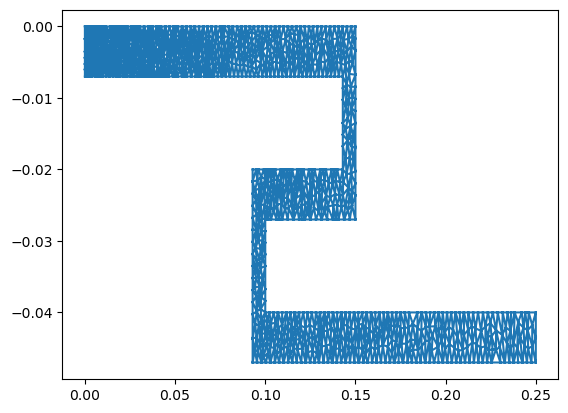

Deflection for v(250,2 S) =  0.003 mm

Value of H = 0.008
The number of points for this mesh is 1217 points


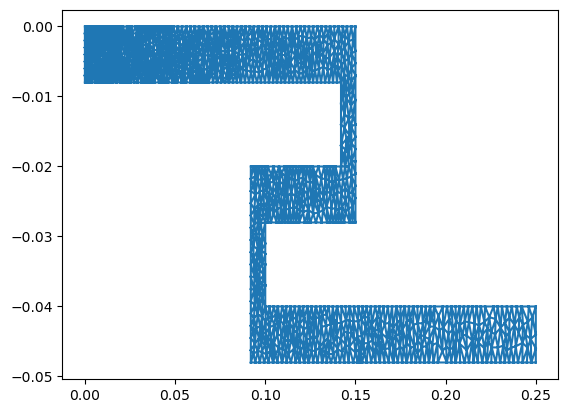

Deflection for v(250,2 S) =  0.043 mm

Value of H = 0.009
The number of points for this mesh is 1332 points


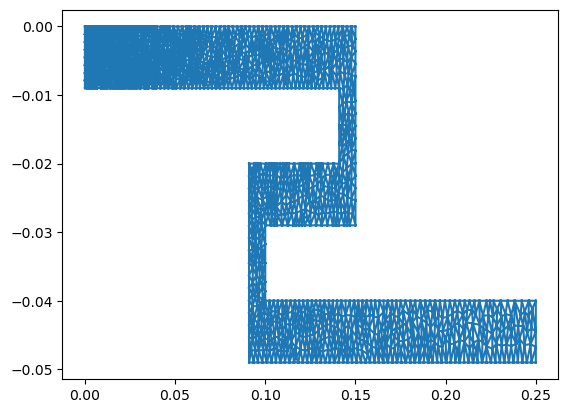

Deflection for v(250,2 S) =  0.004 mm



In [13]:
for H in H_range:
    print(f"Value of H = {round(H,3)}")
    mesh_points, mesh_tris, mesh_facets = create_mesh(S, H)
    glob_stif_matr, f = glob_stif(mesh_tris, mesh_points, mesh_facets)
    v_solution = np.linalg.pinv(glob_stif_matr) @ f

    for n_dim in [0,1]:
        for i in mesh_facets[:, n_dim]:
            if (mesh_points[i][0] == 250*1e-3) and (mesh_points[i][1] == -2*S):
                    p_250_2s = i

    print('Deflection for v(250,2 S) = ', round(v_solution[2*p_250_2s + 1]*10**3, 3), 'mm\n')